In [118]:
from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from kmodes.kprototypes import KPrototypes
from sklearn.preprocessing import LabelEncoder

In [119]:
INPUT_PATH = Path("datasets/bfar.csv")
DF = pd.read_csv(INPUT_PATH)
DF.head()

,RESPONSE,A1:AREA,A2:GROUP,B3:AGE,B5:SEX,B6:M-STATUS,B7:EDUCATION,B8:HH_SIZE,C1:TOT_INCOME/A,C2:INCOME/B/FISH,...,J6:AVE_FBP-PERC,J7.1,J7.2,J7.3,J7.4,J7.5,J7:AVE_FBP-CONT,K:COMMENTS,CD: P_SCORE,CV: PS_WT
0,1,ABULUG,1,33,1,2,3,2,1,1,...,4.67,3.0,3.0,5.0,5.0,5.0,4.2,NaN,NaN,NaN
1,2,ABULUG,1,57,1,3,3,2,1,1,...,5.00,5.0,5.0,5.0,5.0,5.0,5.0,NaN,NaN,NaN
2,3,ABULUG,1,45,1,2,3,2,1,1,...,4.83,5.0,5.0,5.0,5.0,5.0,5.0,NaN,NaN,NaN
3,4,ABULUG,1,32,1,1,3,3,1,1,...,4.33,5.0,5.0,5.0,5.0,5.0,5.0,NaN,NaN,NaN
4,5,ABULUG,1,38,1,1,3,1,1,1,...,5.00,1.0,5.0,5.0,5.0,5.0,4.2,NaN,NaN,NaN


In [120]:
print("Data Frame Shape", DF.shape)

Data Frame Shape (1339, 215)


In [121]:
# Check if there is missing values
MISSING_DATA = DF.isnull().sum()
MISSING_DATA[MISSING_DATA > 0]

Y_BOAT-RE           740
NY_W/BOAT           740
BOAT_COND           740
J1:BOAT_AGREE       740
J2:BOAT_TYPE        740
J3:BOAT_DESIGN      740
J4:BOAT_COND        740
J4: REASON-NO       740
J5.1                740
J5.2                740
J5.3                740
J5.4                740
J5.5                740
J5.6                740
J5.7                740
J6:AVE_FBP-IMPT     740
J6.1                740
J6.2                740
J6.3                740
J6.4                740
J6.5                740
J6.6                740
J6:AVE_FBP-PERC     740
J7.1                740
J7.2                740
J7.3                740
J7.4                740
J7.5                740
J7:AVE_FBP-CONT     740
K:COMMENTS         1339
CD: P_SCORE        1339
CV: PS_WT          1339
dtype: int64

In [122]:
sns.set(style="whitegrid")

# Before
ROWS_BEFORE = len(DF)
print(f"Rows before dropping duplicates: {ROWS_BEFORE}")

# After
DF = DF.drop_duplicates()
ROWS_AFTER = len(DF)
print(f"Remaining rows after dropping duplicates: {ROWS_AFTER}")

Rows before dropping duplicates: 1339
Remaining rows after dropping duplicates: 1339


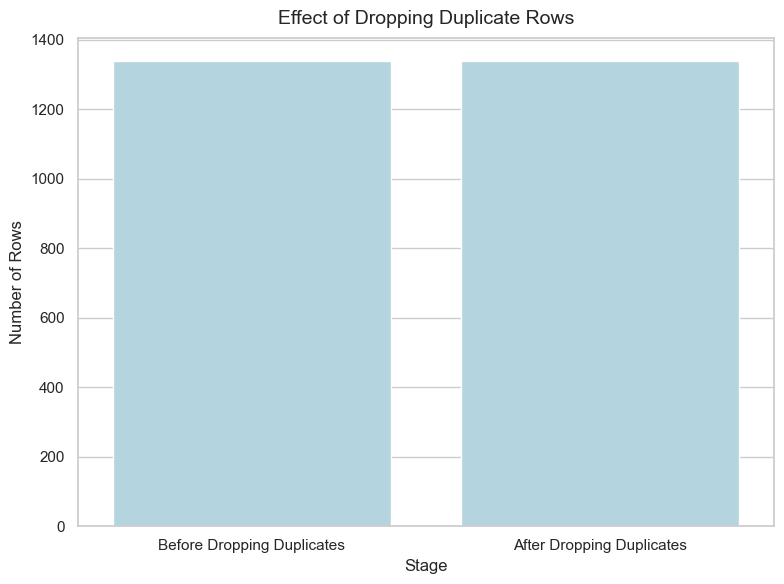

In [123]:
DATA = {
    'Stage': ['Before Dropping Duplicates', 'After Dropping Duplicates'],
    'Row Count': [ROWS_BEFORE, ROWS_AFTER]
}
PLOT_DF = pd.DataFrame(DATA)

plt.figure(figsize=(8, 6))
sns.barplot(x='Stage', y='Row Count', hue='Stage', data=PLOT_DF, palette=['lightblue', 'lightblue'], dodge=False)
plt.title('Effect of Dropping Duplicate Rows', fontsize=14, pad=10)
plt.xlabel('Stage', fontsize=12)
plt.ylabel('Number of Rows', fontsize=12)
plt.legend([],[], frameon=False)
plt.tight_layout()

plt.show()

In [124]:
print(f"Total columns with missing values: {len(MISSING_DATA)}")

Total columns with missing values: 215


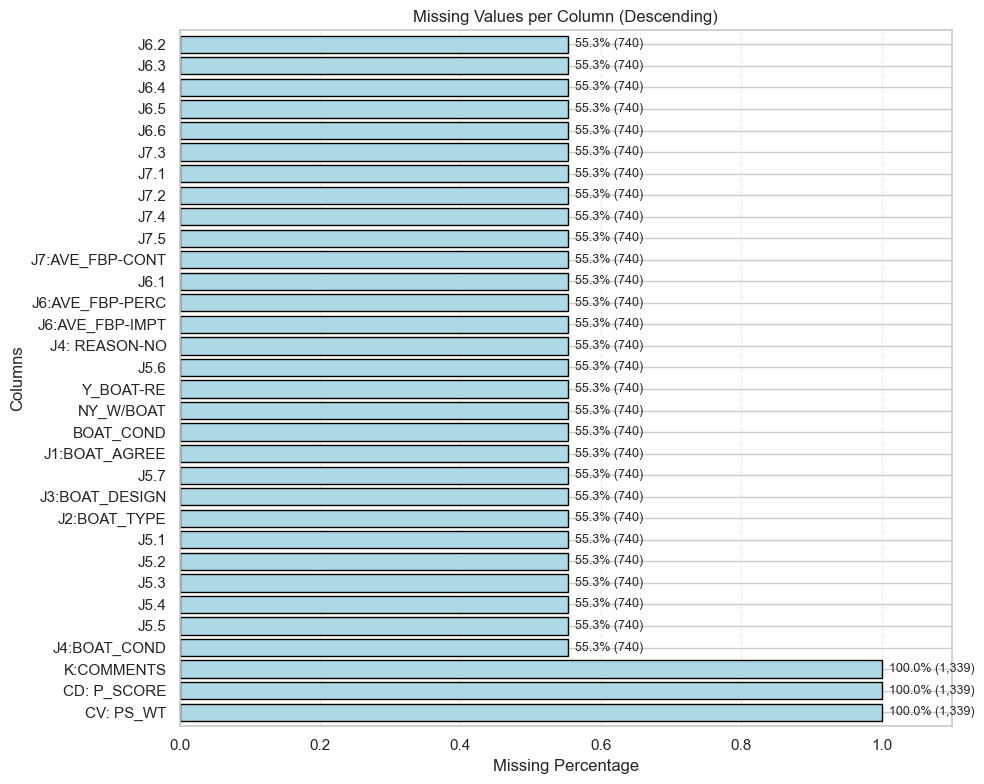

In [125]:
MISSING_PERCENT = DF.isnull().mean().sort_values(ascending=False)  
MISSING_COUNT = DF.isnull().sum()[MISSING_PERCENT.index]  # Get counts in same order

ax = MISSING_PERCENT[MISSING_PERCENT > 0].plot(
    kind='barh', 
    figsize=(10, 8),
    color='lightblue',
    edgecolor='black', 
    title='Missing Values per Column (Descending)',
    width=0.8
)

for index, (col, percent) in enumerate(MISSING_PERCENT[MISSING_PERCENT > 0].items()):
    count = MISSING_COUNT[col]
    label = f"{percent:.1%} ({count:,})"  
    ax.text(
        percent + 0.01,  
        index,         
        label, 
        va='center',   
        fontsize=9
    )

plt.xlabel('Missing Percentage', fontsize=12)
plt.ylabel('Columns', fontsize=12)
plt.xlim(0, 1.1) 
plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

In [126]:
# Fix missing values
NUM_COLS = DF.select_dtypes(include='number').columns

for COL in NUM_COLS:
    MEDIAN_VALUE = DF[COL].median()
    DF[COL] = DF[COL].fillna(MEDIAN_VALUE)

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [127]:
# Check if there is still missing values
MISSING_DATA = DF.isnull().sum()
MISSING_DATA[MISSING_DATA > 0]

K:COMMENTS     1339
CD: P_SCORE    1339
CV: PS_WT      1339
dtype: int64

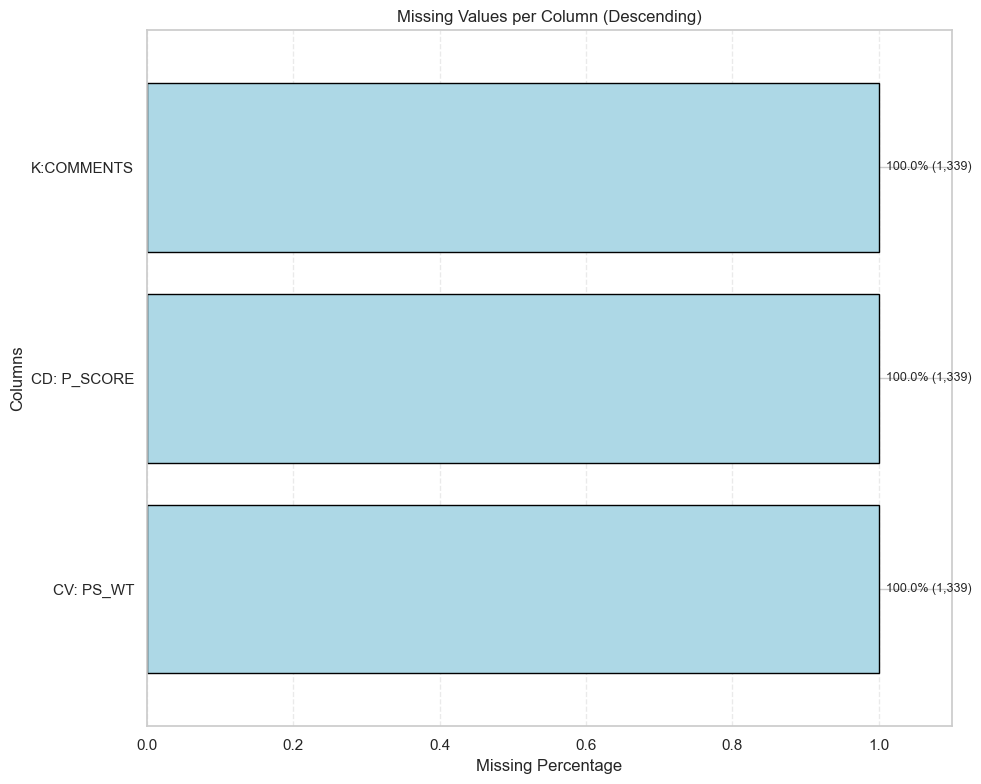

In [128]:
MISSING_PERCENT = DF.isnull().mean().sort_values(ascending=False)  
MISSING_COUNT = DF.isnull().sum()[MISSING_PERCENT.index]  

ax = MISSING_PERCENT[MISSING_PERCENT > 0].plot(
    kind='barh', 
    figsize=(10, 8),
    color='lightblue',
    edgecolor='black', 
    title='Missing Values per Column (Descending)',
    width=0.8
)

for index, (col, percent) in enumerate(MISSING_PERCENT[MISSING_PERCENT > 0].items()):
    count = MISSING_COUNT[col]
    label = f"{percent:.1%} ({count:,})"  
    ax.text(
        percent + 0.01,  
        index,         
        label, 
        va='center',   
        fontsize=9
    )

plt.xlabel('Missing Percentage', fontsize=12)
plt.ylabel('Columns', fontsize=12)
plt.xlim(0, 1.1) 
plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

In [129]:
# Drop columns with 50% or more missing values
THRESHOLD_COL = len(DF) * 0.5
DF = DF.dropna(axis=1, thresh=THRESHOLD_COL)

In [130]:
# Check if column with 50% or more missing values already dropped
DF

,RESPONSE,A1:AREA,A2:GROUP,B3:AGE,B5:SEX,B6:M-STATUS,B7:EDUCATION,B8:HH_SIZE,C1:TOT_INCOME/A,C2:INCOME/B/FISH,...,J6.4,J6.5,J6.6,J6:AVE_FBP-PERC,J7.1,J7.2,J7.3,J7.4,J7.5,J7:AVE_FBP-CONT
0,1,ABULUG,1,33,1,2,3,2,1,1,...,5.0,5.0,5.0,4.67,3.0,3.0,5.0,5.0,5.0,4.2
1,2,ABULUG,1,57,1,3,3,2,1,1,...,5.0,5.0,5.0,5.00,5.0,5.0,5.0,5.0,5.0,5.0
2,3,ABULUG,1,45,1,2,3,2,1,1,...,4.0,5.0,5.0,4.83,5.0,5.0,5.0,5.0,5.0,5.0
3,4,ABULUG,1,32,1,1,3,3,1,1,...,5.0,5.0,5.0,4.33,5.0,5.0,5.0,5.0,5.0,5.0
4,5,ABULUG,1,38,1,1,3,1,1,1,...,5.0,5.0,5.0,5.00,1.0,5.0,5.0,5.0,5.0,4.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1334,1335,SARANGANI,0,52,1,2,2,1,1,1,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2
1335,1336,SARANGANI,0,63,1,2,2,2,1,1,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2
1336,1337,SARANGANI,0,55,1,2,2,2,1,1,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2
1337,1338,SARANGANI,0,43,1,2,2,1,2,2,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2


In [131]:
# Convert all strings to lowercase
TEXT_COLS = DF.select_dtypes(include='object').columns

for COL in TEXT_COLS:
    DF[COL] = DF[COL].astype(str).str.lower().str.strip()

In [132]:
# check if all strings converted to lowercase
DF

,RESPONSE,A1:AREA,A2:GROUP,B3:AGE,B5:SEX,B6:M-STATUS,B7:EDUCATION,B8:HH_SIZE,C1:TOT_INCOME/A,C2:INCOME/B/FISH,...,J6.4,J6.5,J6.6,J6:AVE_FBP-PERC,J7.1,J7.2,J7.3,J7.4,J7.5,J7:AVE_FBP-CONT
0,1,abulug,1,33,1,2,3,2,1,1,...,5.0,5.0,5.0,4.67,3.0,3.0,5.0,5.0,5.0,4.2
1,2,abulug,1,57,1,3,3,2,1,1,...,5.0,5.0,5.0,5.00,5.0,5.0,5.0,5.0,5.0,5.0
2,3,abulug,1,45,1,2,3,2,1,1,...,4.0,5.0,5.0,4.83,5.0,5.0,5.0,5.0,5.0,5.0
3,4,abulug,1,32,1,1,3,3,1,1,...,5.0,5.0,5.0,4.33,5.0,5.0,5.0,5.0,5.0,5.0
4,5,abulug,1,38,1,1,3,1,1,1,...,5.0,5.0,5.0,5.00,1.0,5.0,5.0,5.0,5.0,4.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1334,1335,sarangani,0,52,1,2,2,1,1,1,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2
1335,1336,sarangani,0,63,1,2,2,2,1,1,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2
1336,1337,sarangani,0,55,1,2,2,2,1,1,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2
1337,1338,sarangani,0,43,1,2,2,1,2,2,...,5.0,5.0,5.0,4.67,5.0,5.0,5.0,5.0,5.0,4.2


In [133]:
# DIMENSIONALITY REDUCTION

# In this process i will train 3 models
# - PCA
# - Entropy Weighted K-Means
# - Auto Encoder

# and choose the best performing model for identifyin feature weights with the metrics of
# - Silhouette Score
# - Calinski-Harabasz Index
# - Davies-Bouldin Score

In [134]:
# Model configuration
K = 3
DF_NUM = DF.select_dtypes(include='number').copy()
SCALER = MinMaxScaler()
X_SCALED = SCALER.fit_transform(DF_NUM)

In [135]:
# Create a list to hold all metrics
METRICS_SUMMARY = []

def evaluate_clustering(X, LABELS, NAME):
    SILHOUETTE = silhouette_score(X, LABELS)
    CALINSKI = calinski_harabasz_score(X, LABELS)
    DAVIES = davies_bouldin_score(X, LABELS)
    
    METRICS_SUMMARY.append({
        'Model': NAME,
        'Silhouette': SILHOUETTE,
        'Calinski-Harabasz': CALINSKI,
        'Davies-Bouldin': DAVIES
    })
    
    RESULTS_DF = pd.DataFrame([{
        'Model': NAME,
        'Silhouette': f"{SILHOUETTE:.4f}",
        'Calinski-Harabasz': f"{CALINSKI:.4f}",
        'Davies-Bouldin': f"{DAVIES:.4f}"
    }]).set_index('Model')
    
    print(f"\n{NAME} Clustering Evaluation:")
    display(RESULTS_DF.style
           .set_properties(**{'text-align': 'center'})
           .format(precision=4))

In [136]:
# PCA
PCA_MODEL = PCA(n_components=2)
X_PCA = PCA_MODEL.fit_transform(X_SCALED)

KMEANS_PCA = KMeans(n_clusters=K, random_state=42, n_init=10)
LABELS_PCA = KMEANS_PCA.fit_predict(X_PCA)

evaluate_clustering(X_PCA, LABELS_PCA, "PCA")


PCA Clustering Evaluation:


,Silhouette,Calinski-Harabasz,Davies-Bouldin
Model,,,
PCA,0.3980,1362.5074,0.8724


In [137]:
# Autoencoder
INPUT_DIM = X_SCALED.shape[1]

INPUT_LAYER = Input(shape=(INPUT_DIM,))
ENCODED = Dense(16, activation='relu')(INPUT_LAYER)
BOTTLENECK = Dense(2, activation='linear')(ENCODED)
DECODED = Dense(16, activation='relu')(BOTTLENECK)
OUTPUT_LAYER = Dense(INPUT_DIM, activation='sigmoid')(DECODED)

AUTOENCODER = Model(INPUT_LAYER, OUTPUT_LAYER)
AUTOENCODER.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

AUTOENCODER.fit(X_SCALED, X_SCALED, epochs=100, batch_size=32, verbose=0,
                callbacks=[EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)])

ENCODER = Model(inputs=INPUT_LAYER, outputs=BOTTLENECK)
X_AE = ENCODER.predict(X_SCALED)

KMEANS_AE = KMeans(n_clusters=K, random_state=42, n_init=10)
LABELS_AE = KMEANS_AE.fit_predict(X_AE)

evaluate_clustering(X_AE, LABELS_AE, "Autoencoder")

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

Autoencoder Clustering Evaluation:


,Silhouette,Calinski-Harabasz,Davies-Bouldin
Model,,,
Autoencoder,0.4738,1577.7962,0.8216


In [138]:
# Entropy Weighted K-Means
def entropy_weights(X):
    X_NORM = X / (X.sum(axis=0) + 1e-9)
    X_NORM = np.where(X_NORM == 0, 1e-9, X_NORM)
    ENTROPY = -np.sum(X_NORM * np.log(X_NORM), axis=0) / np.log(len(X))
    D = 1 - ENTROPY
    WEIGHTS = D / D.sum()
    return WEIGHTS

WEIGHTS = entropy_weights(X_SCALED)
X_ENTROPY = X_SCALED * WEIGHTS

KMEANS_ENTROPY = KMeans(n_clusters=K, random_state=42, n_init=10)
LABELS_ENTROPY = KMEANS_ENTROPY.fit_predict(X_ENTROPY)

evaluate_clustering(X_ENTROPY, LABELS_ENTROPY, "Entropy-Weighted")


Entropy-Weighted Clustering Evaluation:


,Silhouette,Calinski-Harabasz,Davies-Bouldin
Model,,,
Entropy-Weighted,0.1686,86.6478,3.0035


In [139]:
METRICS_DF = pd.DataFrame(METRICS_SUMMARY)
SCORING_DF = METRICS_DF.copy()

# Invert Davies-Bouldin because lower is better
SCORING_DF['Inverse Davies-Bouldin'] = 1 / (SCORING_DF['Davies-Bouldin'] + 1e-6)

# Scale all metrics between 0 and 1
SCALER = MinMaxScaler()
SCALED_METRICS = SCALER.fit_transform(SCORING_DF[['Silhouette', 'Calinski-Harabasz', 'Inverse Davies-Bouldin']])

# Add composite score (mean of scaled metrics)
SCORING_DF['Composite Score'] = SCALED_METRICS.mean(axis=1)

# Find the best model
BEST_MODEL = SCORING_DF.loc[SCORING_DF['Composite Score'].idxmax()]

# Show metrics summary
print("\nOverall Clustering Metrics Summary:")
display(METRICS_DF)


Overall Clustering Metrics Summary:


,Model,Silhouette,Calinski-Harabasz,Davies-Bouldin
0,PCA,0.398025,1362.507416,0.872423
1,Autoencoder,0.473812,1577.796218,0.821649
2,Entropy-Weighted,0.168575,86.647821,3.003505


In [140]:
print("\nBest Performing Model")
display(pd.DataFrame({
    '': ['Model', 'Composite Score'],
    'Best Performance': [BEST_MODEL['Model'], f"{BEST_MODEL['Composite Score']:.4f}"]
}).style.hide(axis='index'))


Best Performing Model


,Best Performance
Model,Autoencoder
Composite Score,1.0000


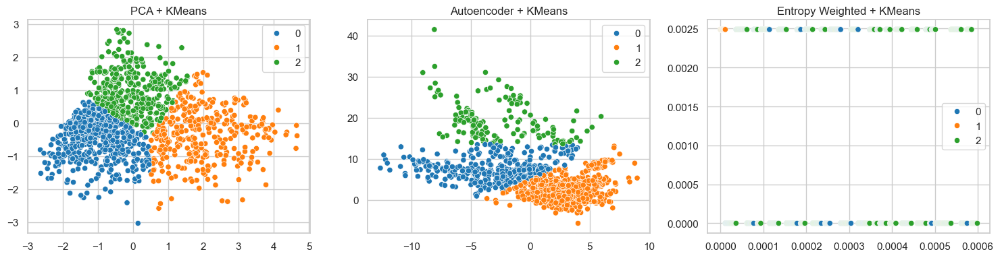

In [141]:
# Plot scattered distribution in each model to check if the best performing model is reasonable
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
sns.scatterplot(x=X_PCA[:, 0], y=X_PCA[:, 1], hue=LABELS_PCA, palette="tab10")
plt.title("PCA + KMeans")

plt.subplot(1, 3, 2)
sns.scatterplot(x=X_AE[:, 0], y=X_AE[:, 1], hue=LABELS_AE, palette="tab10")
plt.title("Autoencoder + KMeans")

plt.subplot(1, 3, 3)
sns.scatterplot(x=X_ENTROPY[:, 0], y=X_ENTROPY[:, 1], hue=LABELS_ENTROPY, palette="tab10")
plt.title("Entropy Weighted + KMeans")

plt.tight_layout()
plt.show()

In [142]:
print("\nExtracting Feature Weights from Best Model...\n")

if BEST_MODEL['Model'] == "PCA":
    PCA_WEIGHTS = np.abs(PCA_MODEL.components_[:2]).mean(axis=0)
    FEATURE_WEIGHTS = pd.Series(PCA_WEIGHTS, index=DF_NUM.columns).sort_values(ascending=False)

elif BEST_MODEL['Model'] == "Autoencoder":
    ENCODER_WEIGHTS = np.abs(AUTOENCODER.layers[1].get_weights()[0])  
    SUMMED_WEIGHTS = ENCODER_WEIGHTS.sum(axis=1)
    FEATURE_WEIGHTS = pd.Series(SUMMED_WEIGHTS, index=DF_NUM.columns).sort_values(ascending=False)

elif BEST_MODEL['Model'] == "Entropy-Weighted":
    FEATURE_WEIGHTS = pd.Series(WEIGHTS, index=DF_NUM.columns).sort_values(ascending=False)


Extracting Feature Weights from Best Model...



In [143]:
# Show top features
print("📌 Top Contributing Features:")
display(FEATURE_WEIGHTS.head(10))

📌 Top Contributing Features:


D2/A:Ind_APP     11.972435
D1/A:Ind_VEH     11.090771
D1/B:Ind_VEH     10.557349
D2.7-A_QTY        8.336466
D2/B:Ind_APP      8.041806
D2.7:A_STOVE      8.025345
H:Ind_ASWS        7.619016
D3.4-A_QTY        7.268851
D3.4:A_OTHERS     7.225698
D3.1:B_CP         7.176279
dtype: float32

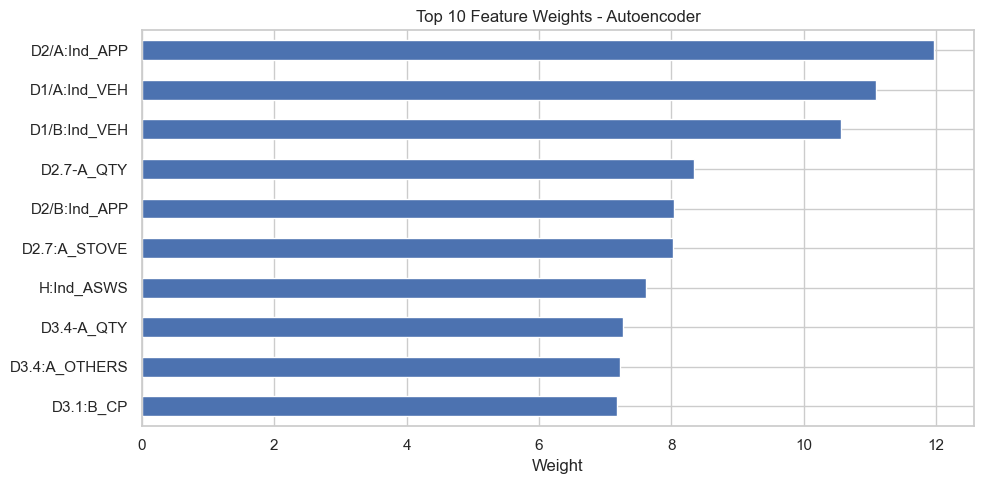

In [144]:
plt.figure(figsize=(10, 5))
FEATURE_WEIGHTS.head(10).plot(kind='barh')
plt.gca().invert_yaxis()
plt.title(f"Top 10 Feature Weights - {BEST_MODEL['Model']}")
plt.xlabel("Weight")
plt.tight_layout()
plt.show()

In [145]:
print("All Feature Weights:")
display(FEATURE_WEIGHTS.to_frame(name="Weight").style
       .background_gradient(cmap='Blues', subset=['Weight'])
       .format({'Weight': '{:.4f}'})
       .set_properties(**{'text-align': 'center'})
       .set_caption(f"Feature Importance ({BEST_MODEL['Model']})"))

All Feature Weights:


,Weight
D2/A:Ind_APP,11.9724
D1/A:Ind_VEH,11.0908
D1/B:Ind_VEH,10.5573
D2.7-A_QTY,8.3365
D2/B:Ind_APP,8.0418
D2.7:A_STOVE,8.0253
H:Ind_ASWS,7.6190
D3.4-A_QTY,7.2689
D3.4:A_OTHERS,7.2257
D3.1:B_CP,7.1763


In [146]:
# ENSEMBLE LEARNING FOR CLUSTERING

# In this process i will train 3 models
# - Entropy Weighted K-Means
# - K-Prototypes
# - Hierarchical Clustering

# and choose the best performing model for identifyin feature weights with the metrics of
# - Silhouette Score
# - Calinski-Harabasz Index
# - Davies-Bouldin Score

In [147]:
# Model configuration
K = 3
DF_CLEANED = DF.copy()

In [148]:
# Separate numeric and categorical
DF_NUM = DF_CLEANED.select_dtypes(include='number')
DF_CAT = DF_CLEANED.select_dtypes(include='object')

In [149]:
# Normalize numeric data
SCALER = MinMaxScaler()
X_NUM_SCALED = SCALER.fit_transform(DF_NUM)

In [150]:
# Label encode categorical data
LABEL_ENCODERS = {}
DF_CAT_ENCODED = DF_CAT.copy()
for COL in DF_CAT.columns:
    LE = LabelEncoder()
    DF_CAT_ENCODED[COL] = LE.fit_transform(DF_CAT[COL])
    LABEL_ENCODERS[COL] = LE

X_CAT_ENCODED = DF_CAT_ENCODED.values

In [151]:
# Combine numeric and categorical
X_MIXED = np.concatenate([X_NUM_SCALED, X_CAT_ENCODED], axis=1)

In [152]:
# Created a list that holds all the metrics
METRICS_SUMMARY_2 = []

def evaluate_model(X, LABELS, NAME):
    SILHOUETTE = silhouette_score(X, LABELS)
    CALINSKI = calinski_harabasz_score(X, LABELS)
    DAVIES = davies_bouldin_score(X, LABELS)
    
    METRICS_SUMMARY_2.append({
        'Model': NAME,
        'Silhouette': SILHOUETTE,
        'Calinski-Harabasz': CALINSKI,
        'Davies-Bouldin': DAVIES
    })
    
    RESULTS_DF = pd.DataFrame([{
        'Model': NAME,
        'Silhouette': f"{SILHOUETTE:.4f}",
        'Calinski-Harabasz': f"{CALINSKI:.4f}",
        'Davies-Bouldin': f"{DAVIES:.4f}"
    }]).set_index('Model')
    
    print(f"\n{NAME} Clustering Evaluation:")
    display(RESULTS_DF.style
           .set_properties(**{'text-align': 'center'})
           .format(precision=4))

In [153]:
# Entropy Weigthed K-Means
def entropy_weights(X):
    X_NORM = X / (X.sum(axis=0) + 1e-9)
    X_NORM = np.where(X_NORM == 0, 1e-9, X_NORM)
    ENTROPY = -np.sum(X_NORM * np.log(X_NORM), axis=0) / np.log(len(X))
    D = 1 - ENTROPY
    WEIGHTS = D / D.sum()
    return WEIGHTS

WEIGHTS = entropy_weights(X_NUM_SCALED)
X_WEIGHTED = X_NUM_SCALED * WEIGHTS

KMEANS_WEIGHTED = KMeans(n_clusters=K, random_state=42, n_init=10)
LABELS_WKMEANS = KMEANS_WEIGHTED.fit_predict(X_WEIGHTED)

evaluate_model(X_WEIGHTED, LABELS_WKMEANS, "Weighted KMeans")


Weighted KMeans Clustering Evaluation:


,Silhouette,Calinski-Harabasz,Davies-Bouldin
Model,,,
Weighted KMeans,0.1686,86.6478,3.0035


In [154]:
# K-Prototypes
KPROTO = KPrototypes(n_clusters=K, init='Cao', n_init=5, verbose=0)
LABELS_KPROTO = KPROTO.fit_predict(X_MIXED, categorical=list(range(X_NUM_SCALED.shape[1], X_MIXED.shape[1])))

evaluate_model(X_MIXED, LABELS_KPROTO, "K-Prototypes")


K-Prototypes Clustering Evaluation:


,Silhouette,Calinski-Harabasz,Davies-Bouldin
Model,,,
K-Prototypes,0.0127,36.5386,4.7558


In [155]:
# Hierarchical Clustering
HIERARCHICAL = AgglomerativeClustering(n_clusters=K, linkage='ward')
LABELS_HIER = HIERARCHICAL.fit_predict(X_NUM_SCALED)

evaluate_model(X_NUM_SCALED, LABELS_HIER, "Hierarchical Clustering")


Hierarchical Clustering Clustering Evaluation:


,Silhouette,Calinski-Harabasz,Davies-Bouldin
Model,,,
Hierarchical Clustering,0.0782,69.2062,3.0031


In [156]:
METRICS_DF2 = pd.DataFrame(METRICS_SUMMARY_2)
SCORING_DF2 = METRICS_DF2.copy()
SCORING_DF2['Inverse Davies-Bouldin'] = 1 / (SCORING_DF2['Davies-Bouldin'] + 1e-6)
SCALER = MinMaxScaler()
SCALED = SCALER.fit_transform(SCORING_DF2[['Silhouette', 'Calinski-Harabasz', 'Inverse Davies-Bouldin']])
SCORING_DF2['Composite Score'] = SCALED.mean(axis=1)

In [157]:
BEST_MODEL2 = SCORING_DF2.loc[SCORING_DF2['Composite Score'].idxmax()]

print("\nBest Performing Clustering Model:")
display(pd.DataFrame({
    '': ['Model', 'Composite Score'],
    'Best Performance': [BEST_MODEL2['Model'], f"{BEST_MODEL2['Composite Score']:.4f}"]
}).style.hide(axis='index'))


Best Performing Clustering Model:


,Best Performance
Model,Weighted KMeans
Composite Score,0.9999


In [158]:
FINAL_LABELS = None

if BEST_MODEL2['Model'] == "Weighted KMeans":
    FINAL_MODEL = KMeans(n_clusters=K, random_state=42, n_init=10)
    FINAL_LABELS = FINAL_MODEL.fit_predict(X_WEIGHTED)

elif BEST_MODEL2['Model'] == "K-Prototypes":
    FINAL_MODEL = KPrototypes(n_clusters=K, init='Cao', n_init=5, verbose=0)
    FINAL_LABELS = FINAL_MODEL.fit_predict(X_MIXED, categorical=list(range(X_NUM_SCALED.shape[1], X_MIXED.shape[1])))

elif BEST_MODEL2['Model'] == "Hierarchical Clustering":
    FINAL_MODEL = AgglomerativeClustering(n_clusters=K, linkage='ward')
    FINAL_LABELS = FINAL_MODEL.fit_predict(X_NUM_SCALED)

DF['final_cluster'] = FINAL_LABELS

C:\Users\User\AppData\Local\Temp\ipykernel_9152\1974701490.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  DF['final_cluster'] = FINAL_LABELS


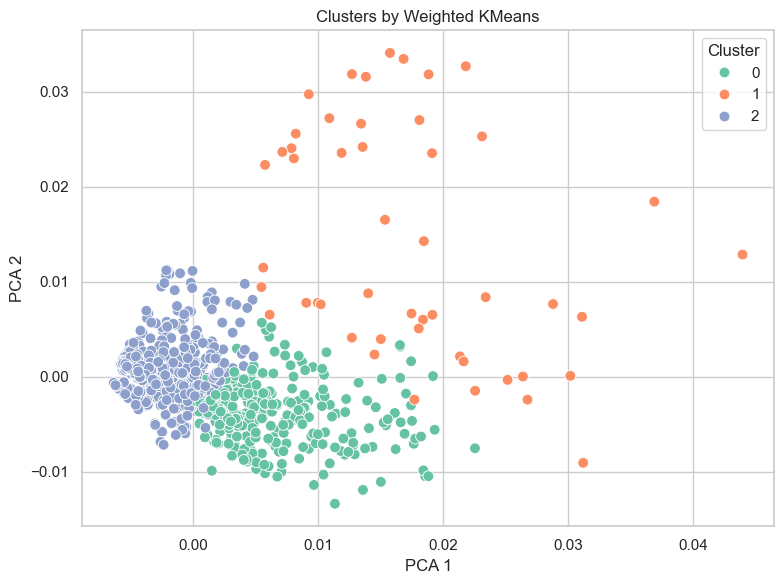

In [159]:
if BEST_MODEL2['Model'] in ["Weighted KMeans", "K-Prototypes", "Hierarchical Clustering"]:
    from sklearn.decomposition import PCA
    PCA_VIS = PCA(n_components=2)
    X_VIS = PCA_VIS.fit_transform(X_WEIGHTED if BEST_MODEL2['Model'] == "Weighted KMeans" else X_NUM_SCALED)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_VIS[:, 0], y=X_VIS[:, 1], hue=FINAL_LABELS, palette="Set2", s=60)
    plt.title(f"Clusters by {BEST_MODEL2['Model']}")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

In [160]:
print("\nPer Feature Cluster Breakdown:\n")

for FEATURE in DF.columns:
    if FEATURE == 'final_cluster':
        continue

    print(f"--- Feature: {FEATURE} ---")

    if DF[FEATURE].dtype in ['int64', 'float64']:
        FEATURE_SUMMARY = DF.groupby('final_cluster')[FEATURE].agg(['mean', 'std', 'min', 'max', 'count'])
    else:
        FEATURE_SUMMARY = DF.groupby('final_cluster')[FEATURE].value_counts(normalize=True).unstack(fill_value=0)

    print(FEATURE_SUMMARY)
    print("\n")


Per Feature Cluster Breakdown:

--- Feature: RESPONSE ---
                     mean         std  min   max  count
final_cluster                                          
0              610.244648  348.353694   28  1319    327
1              436.244898  445.278964    1  1269     49
2              702.184839  389.759888    3  1339    963


--- Feature: A1:AREA ---
A1:AREA          abulug  alubijid    aparri   bolinao  bugasong    buguey  \
final_cluster                                                               
0              0.045872  0.018349  0.055046  0.045872  0.070336  0.076453   
1              0.387755  0.000000  0.040816  0.061224  0.061224  0.000000   
2              0.029076  0.033229  0.056075  0.019730  0.069574  0.057113   

A1:AREA         gitagum    gumaca    hamtic    itogon  ...    manito  \
final_cluster                                          ...             
0              0.027523  0.024465  0.061162  0.061162  ...  0.003058   
1              0.000000  0.02040

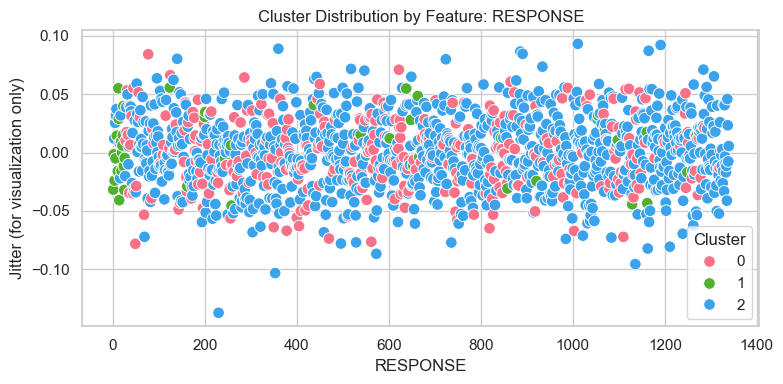

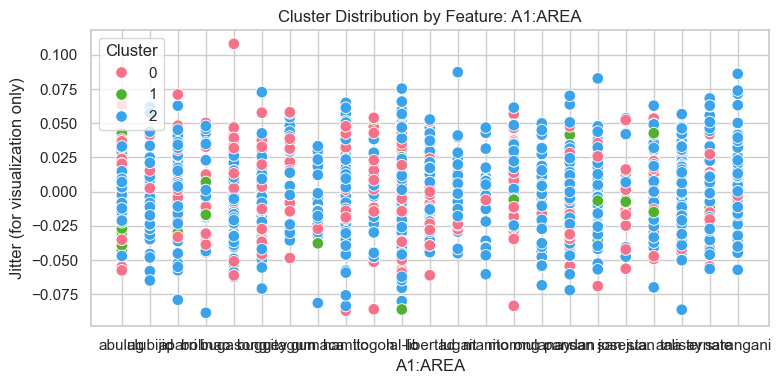

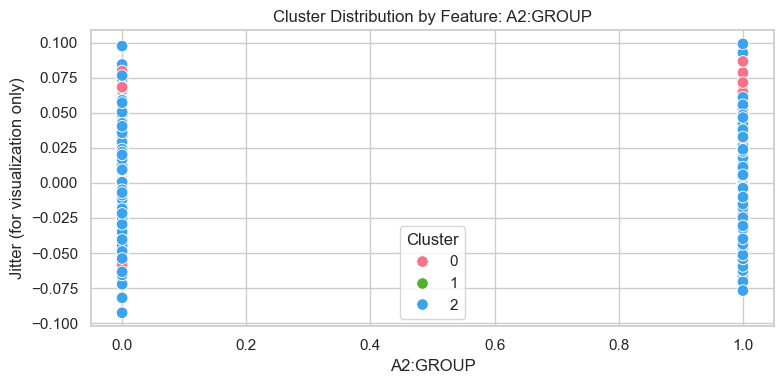

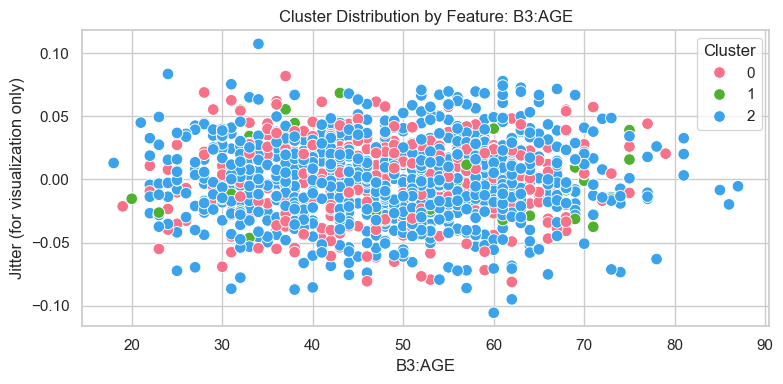

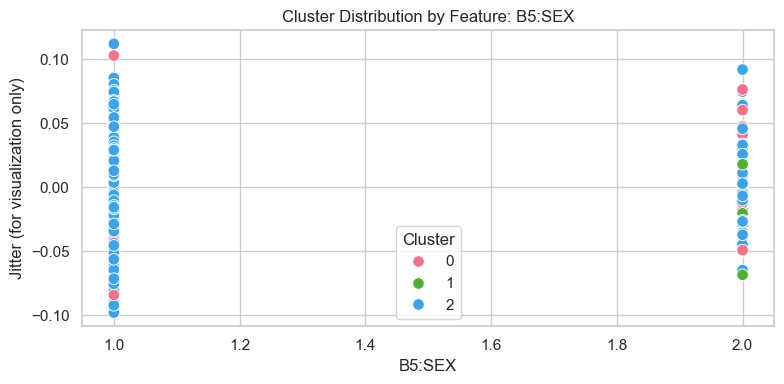

...

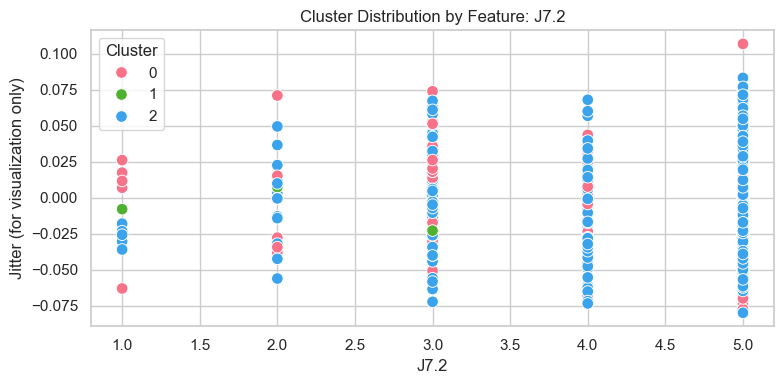

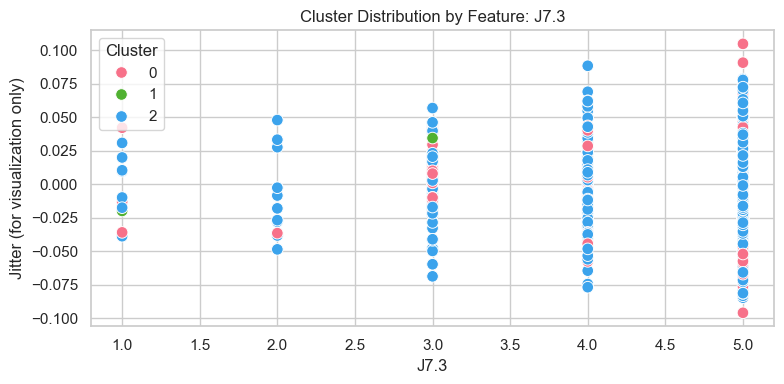

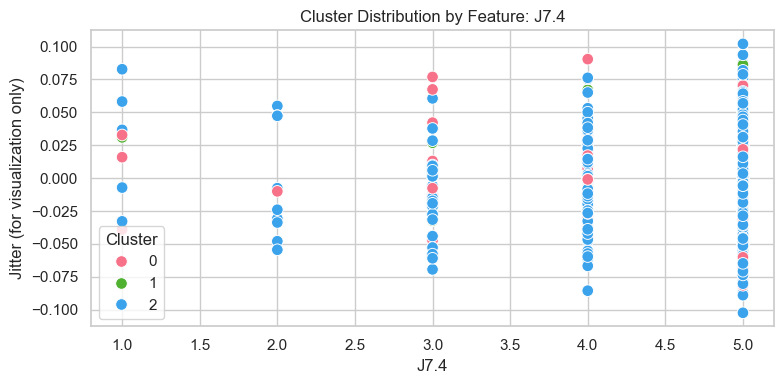

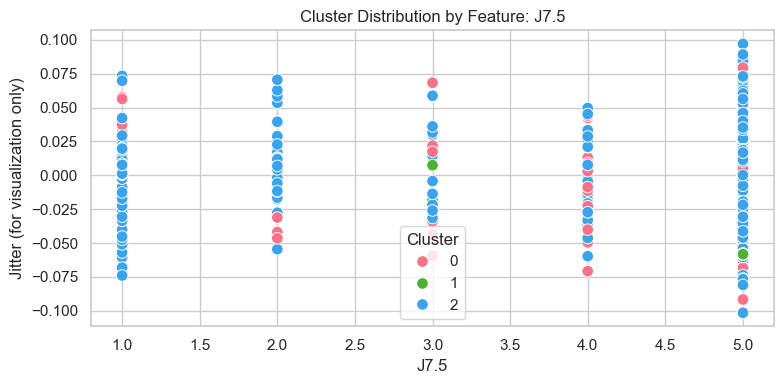

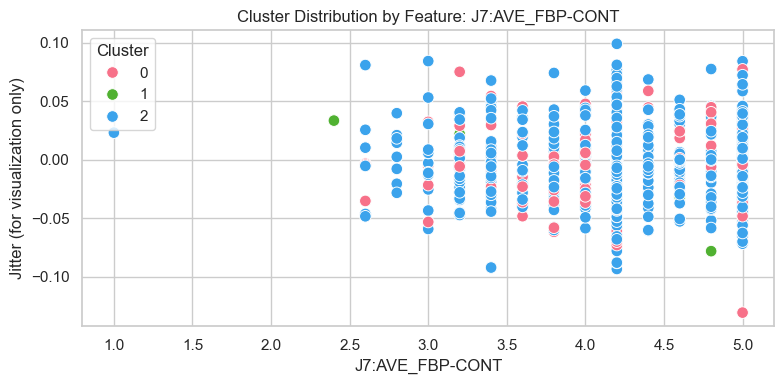

In [161]:
sns.set(style="whitegrid")

PALETTE = sns.color_palette("husl", len(DF['final_cluster'].unique()))

for FEATURE in DF.columns:
    if FEATURE == 'final_cluster':
        continue

    plt.figure(figsize=(8, 4))
    
    JITTER = np.random.normal(0, 0.03, size=len(DF))

    sns.scatterplot(
        x=DF[FEATURE],
        y=JITTER,
        hue=DF['final_cluster'],
        palette=PALETTE,
        marker='o',
        edgecolor='w',
        s=70
    )

    plt.title(f'Cluster Distribution by Feature: {FEATURE}')
    plt.xlabel(FEATURE)
    plt.ylabel('Jitter (for visualization only)')
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()